# PW 1 - Markovian models  
BENEDETTI DA ROSA Giovanni


Sampling of Markovian models.

The aim of this session is to program the Gibbs sampler algorithm and study it in the binary case.

In this section we consider a binary Markov random field (taking values in $E=\{0,1\}$).
The neighborhood is defined in 4-connexity and the potential of a clique of order 2 is defined by :
$U_c(0,1)=U_c(1,0)=+\beta$ and $U_c(1,1)=U_c(0,0)=0$ (the potential for singleton clique is 0).


In [ ]:
import math
import random
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
import imageio
from scipy import ndimage as ndi

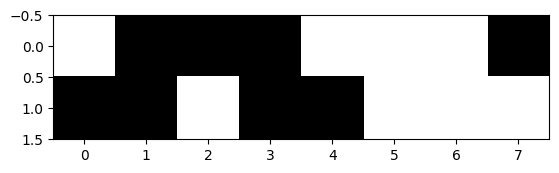

In [ ]:
plt.set_cmap('gray')
np.random.seed(42)

sh=[2,8]

imaU=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaU)
plt.show()

#Q1
For the Ising model defined above, and the imaU generated in the previous cell, give the formula of the global energy and give its value as a function of $\beta$ for imaU.

$$U(x) = \sum_{c∈C}Vc(x) = 10 \beta$$
$$Vc(x) = Vc(x_s, s ∈ c)$$




#A1


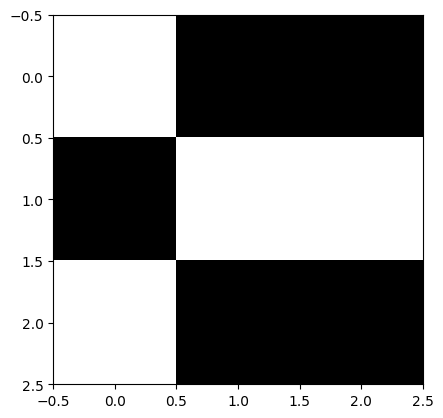

In [ ]:
sh=[3,3]
np.random.seed(42)

imaVois=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaVois)

#Q2

Write the general form of the local conditional probability in a pixel $s$. For the neighborhood configuration imaVois generated by the previous code cell, compute the 2 local conditional energies (for the value 0 and for the value 1 of the central pixel), then the local conditional probabilities (as a function of $\beta$). What is the most probable class ? (NB: do the calculation for an 8-neighborhood).

$$Pr(Xs = xs/ Vs) = \frac{1}{Z^s} exp( −U_s(x_s, V_s))$$

$$Us
(xs, Vs) = \sum_{Xc⊂C,s∈c}Vc(xs, Vs) $$

$$
Z^s=\sum_{ξ∈E}exp( − Us(ξ, Vs))
$$

In the image above:

4 - connectivity


$$U_s(x_s = 1, V_s=(1,0,0,0)) = 3 \beta$$
$$U_s(x_s = 0, V_s=(1,0,0,0)) = 1β$$

$$P(X_s = 0| V_s) = \frac{exp(- 1 \beta)}{exp(- 3 \beta) + exp(- 1 \beta) }$$
$$P(X_s = 1| V_s) = \frac{exp(- 3 \beta)}{exp(- 3 \beta) + exp(- 1 \beta) }$$

8  - connectivity


$$U_s(x_s = 1, V_s=(1,0,0,1,0,1,0,0)) = 5 \beta$$
$$U_s(x_s = 0,V_s=(1,0,0,1,0,1,0,0)) = 3β$$

$$P(X_s = 0| V_s) = \frac{exp(- 3 \beta)}{exp(- 5 \beta) + exp(- 3 \beta) }$$
$$P(X_s = 1| V_s) = \frac{exp(- 5 \beta)}{exp(- 5 \beta) + exp(- 3 \beta) }$$





It's most probable to accepct the 0 because its energy is low, so it's probability is higher.

#A2


## Part 1

Programming the Gibbs sampler and drawing samples of Markovian models



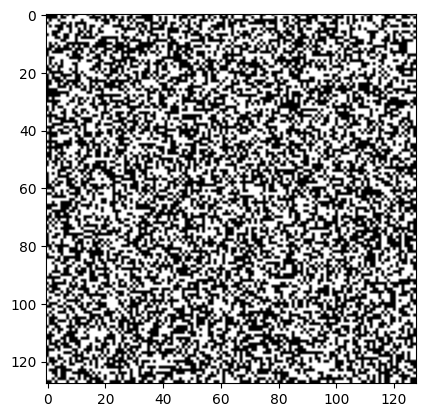

In [ ]:
plt.set_cmap('gray')

sh=[128,128]

im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)
plt.show()

### Sampling function
Complete the following function which takes as input a binary image (which will be updated by Gibbs sampling) and the value of the regularization parameter.


In [ ]:
def echan(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0=((1 if im_bin[i1, j] == 1 else 0) + (1 if im_bin[i, j1] == 1 else 0) + (1 if im_bin[i2, j] == 1 else 0) + (1 if im_bin[i, j2] == 1 else 0))*beta_reg
            p0=math.exp(Ureg0*(-1));

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1=((1 if im_bin[i1, j] == 0 else 0) + (1 if im_bin[i, j1] == 0 else 0) + (1 if im_bin[i2, j] == 0 else 0) + (1 if im_bin[i, j2] == 0 else 0))*beta_reg
            p1=math.exp(Ureg1*(-1));

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j] = 0
                else :
                    im_bin[i,j]= 1

    return im_bin


By varying the value of the regularization parameter and restarting the cell, observe. You can remove the visualization during sampling and increase the number of iterations

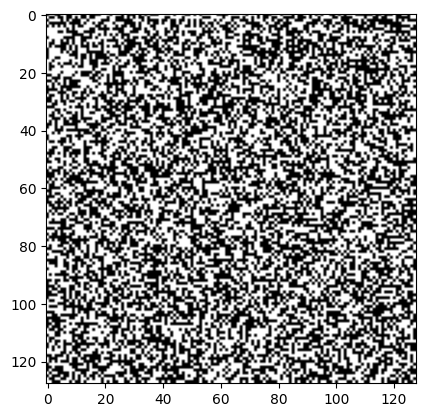

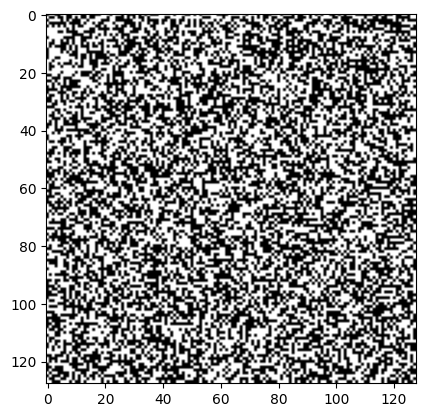

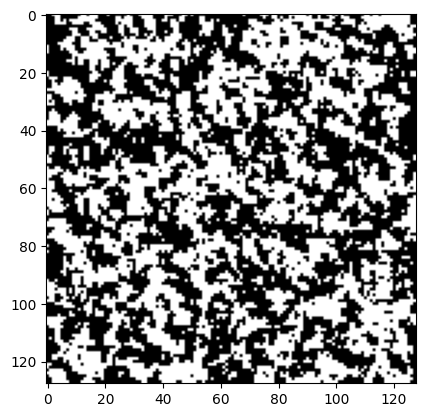

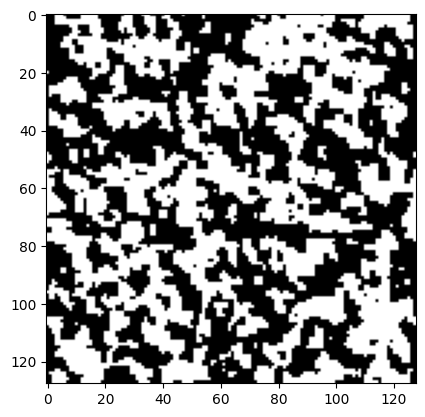

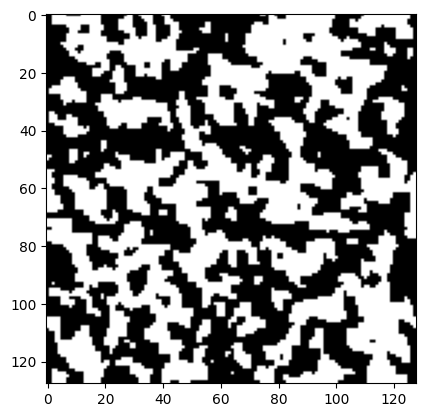

...

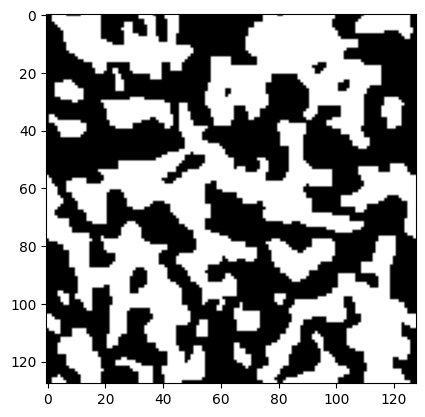

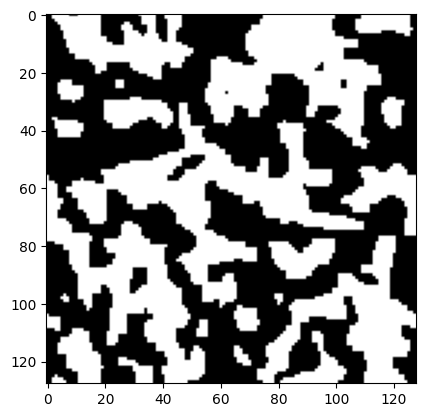

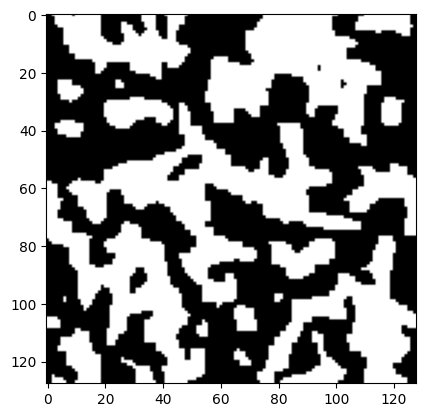

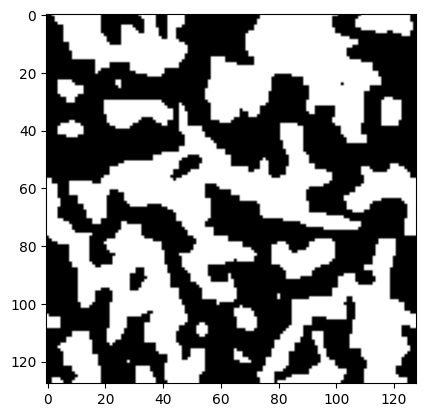

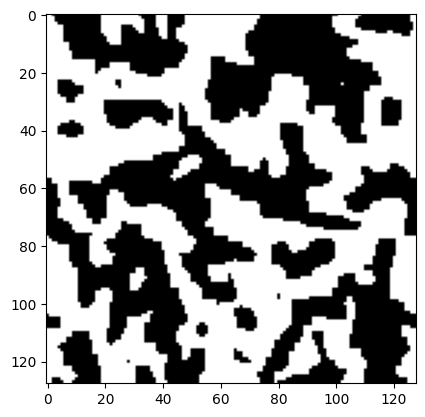

In [ ]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=20

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

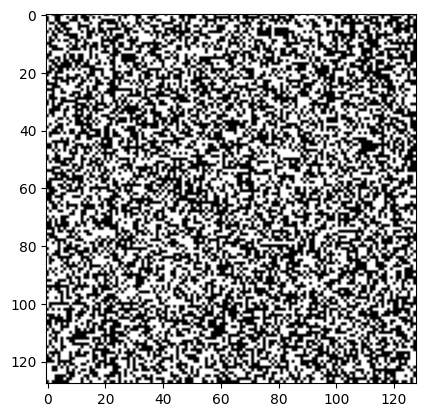

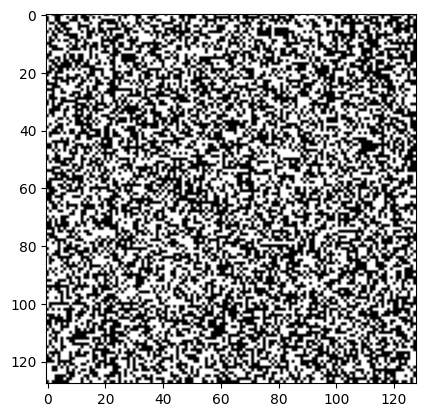

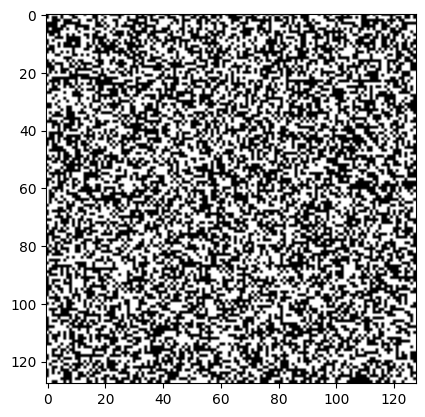

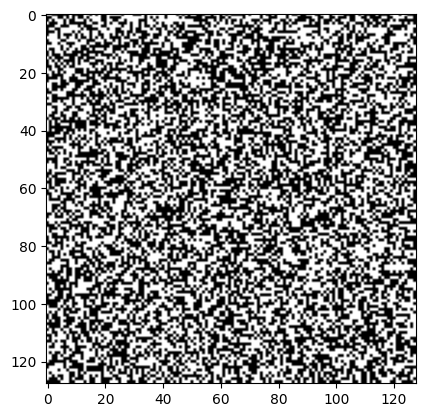

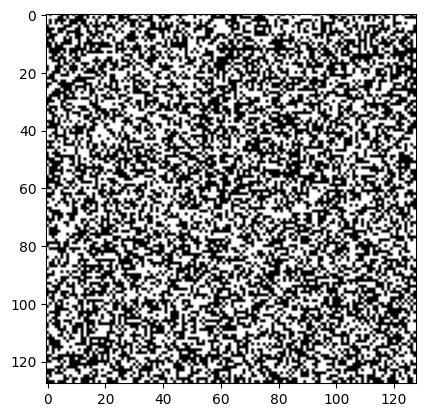

...

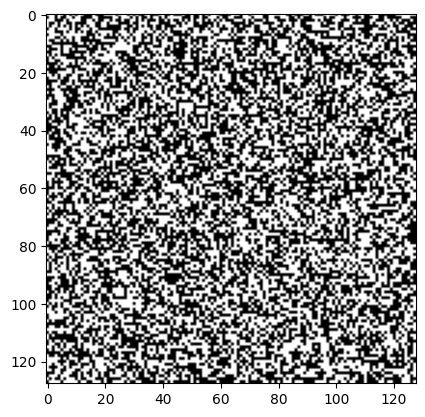

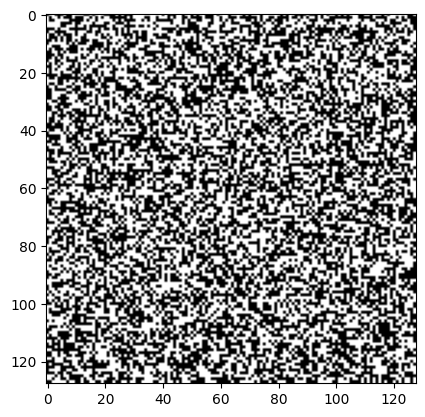

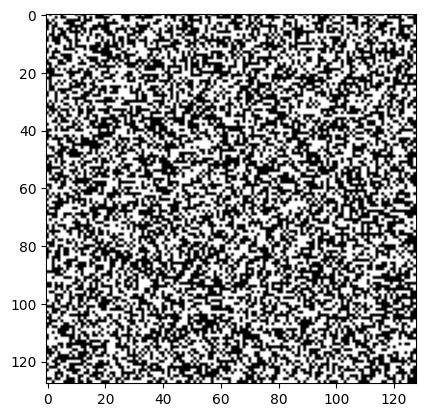

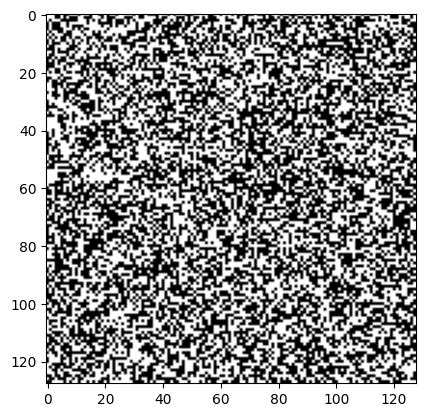

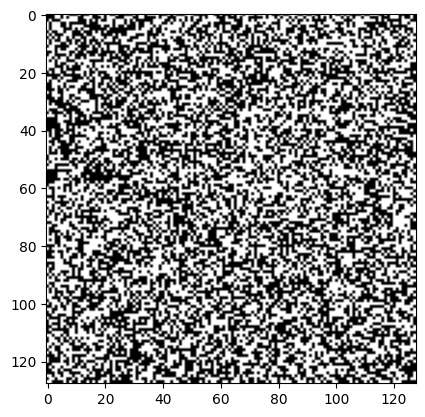

In [ ]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=0.01

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

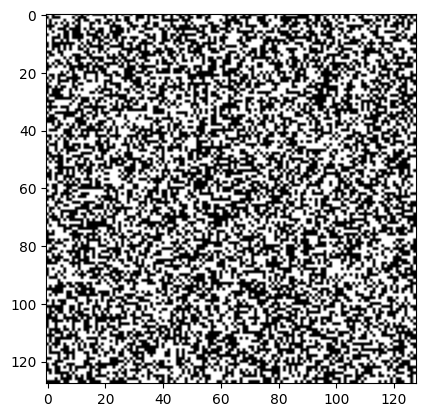

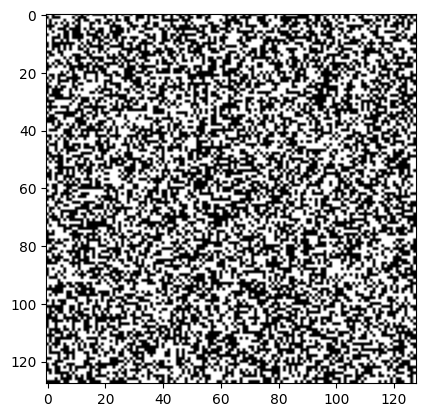

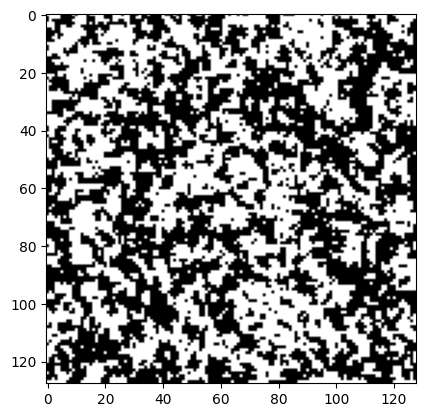

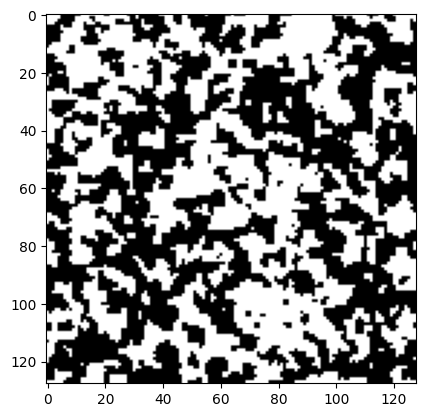

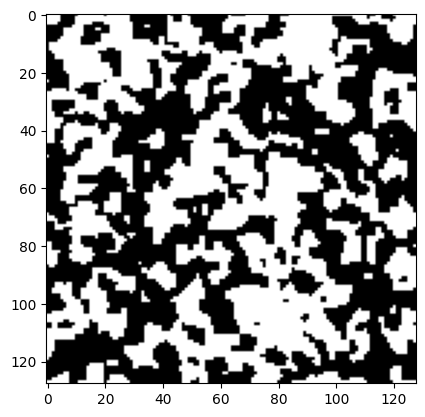

...

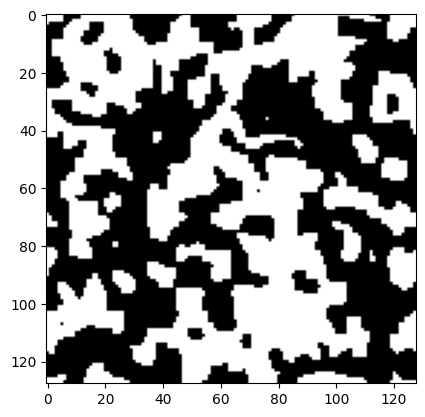

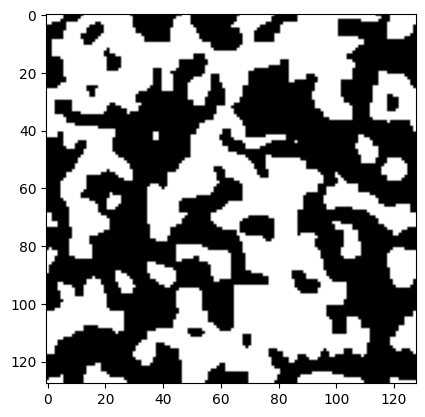

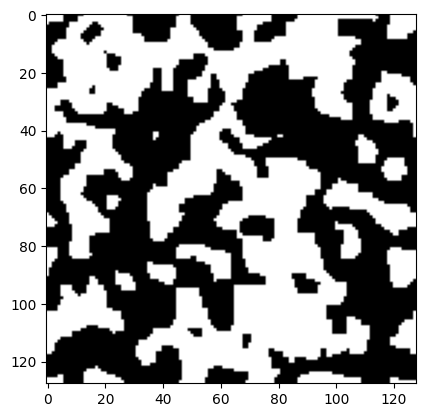

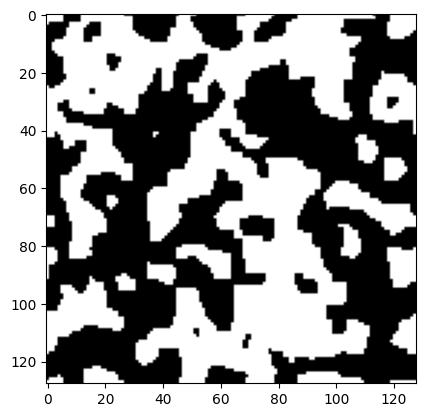

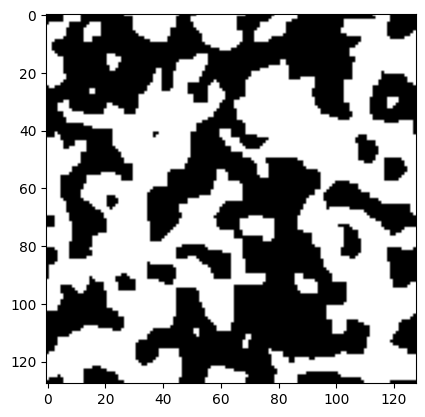

In [ ]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=20
mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

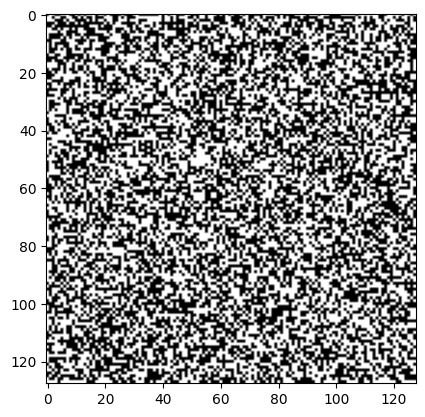

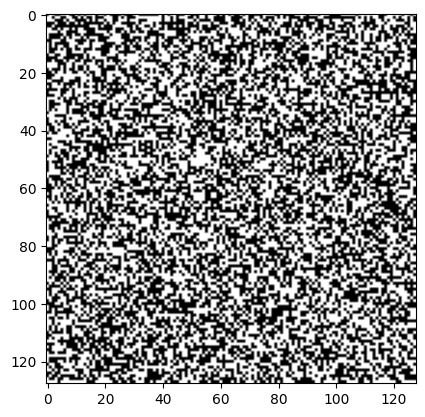

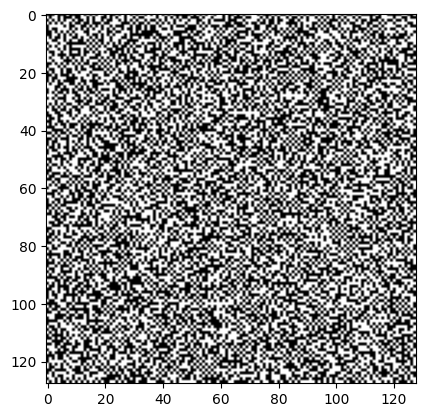

In [ ]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=-0.5
mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    if (n == 100):
      plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
      mafigure.canvas.draw()
      plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

#Q3
Run the program several times. Do you still get the same image? Comment on this.


#A3


If the image itself is random, it's expected that we would get a difference image each time, and this should aldo change in the final image too.

Otherwise, as the sampler is itself random, even if we try with the same image the probaility in each iteration should change too, so we would get the same image.

#Q4

Vary $\beta$ from 0.5 to 20. Comment on the results.

When $\beta$ gets close to a small value this means that the image should not change a lot, because the conditional probility of obtaining 1 or 0, tends to be similar. In a analogie with physics if $T → ∞$, the thermal effects must decouple the exchange interactions in the particles, so it should become random distrubuted.

$$\beta → 0 ⇒  exp(−\beta U(x)) \rightarrow 0 ⇒ P(X_s = 0| V_s) = P(X_s = 1| V_s) = \frac{1}{Z^s}, ∀x_s \in X_s$$
In a similar way when $\beta → ∞$ or gets bigger this means the conditional probability functions should be very different once they depend exponentially of beta. This implies that the effect of neighbors must influence more the value of the pixels, so it should completely determine the value pf the pixels. Again, in a analogie with physics if $T → 0$, the thermal effects must disapear, so we have only the exchange interactions changing each neighbor microstate.

$$\beta → ∞$$.

#A4

#Q5
Which image minimizes the overall energy for this model?

The overall energy is the sum of all clique potentials should be minimized when the image is fully 0 or 1. This is a consequence because the potentials would be always 0. $U_c(1,1)=U_c(0,0)=0$ (the potential for singleton clique is 0).

#A5


#Q6
Change 𝛽 and give it a negative value. Describe the result and justify it.

 In the original algorithm we consider that the image should be represented by a Markov Field relative to its neighbors and because of e Hammersley-Clifford as a Gibbs Field. This assumption implies that in each iteration we are reducing the global energy of the image, for a positive $\beta$. Now, if we consider a negative value of $\beta$ we are increasing the the global energy in  each iteration. This implies that instead the pixels of the same colors becomes together, they become as sparser they can from each other.

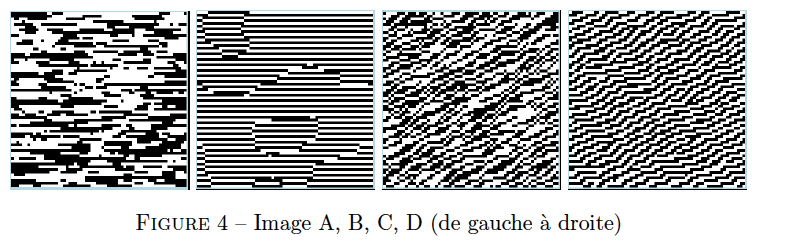

#Q7
We now work in 8-neighborhood, but still with cliques of order 2 (non-isotropic this time). For each of the following images, propose the clique potentials that allow us to obtain these realizations. Initially all clique potentials are zero.


* Image A : there is only one clique potential of order 2 which is -1.
It could be a top or bottom clique equals to -1
* Image B : in addition to the previous one, there is a clique potential of order 2 which is 1. Indicate which one.
Here we could have the top = 1 and bottom = -1 or top = -1 and bottom = 1, beacusae this configuration tends to regularize more the horizontal lines
* Image C: in addition to the 2 previous ones, there is a clique potential of order 2 which is -1. Indicate which one.
It could be a top 45 degress pixel or  1355 degrees clique equals to -1
* Image D: in addition to the 3 previous ones, there is a second order clique potential which is +1. Indicate which one.
Similar to question to the question 2 logic
It could be a 45 degress pixel equals -1 and 135 degrees equals 1 or  45 degrees clique 1 and 135 equals to -1.





#A7



#Q8

Modify your program to define an Ising model with a diagonal attractive potential only (the other potentials are zero). It means that this model **encourages** similar labels (either 0 or 1) for neighboring pixels in the diagonal directions ($\pi/4$ or $3\pi/4$ directions). Comment on the result.

#A8

In [ ]:
def echan(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0=((1 if im_bin[i1, j1] == 1 else 0) + (1 if im_bin[i2, j2] == 1 else 0))*beta_reg
            p0=math.exp(Ureg0*(-1));

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1=((1 if im_bin[i1, j1] == 0 else 0) + (1 if im_bin[i2, j2] == 0 else 0))*beta_reg
            p1=math.exp(Ureg1*(-1));

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j] = 0
                else :
                    im_bin[i,j]= 1

    return im_bin

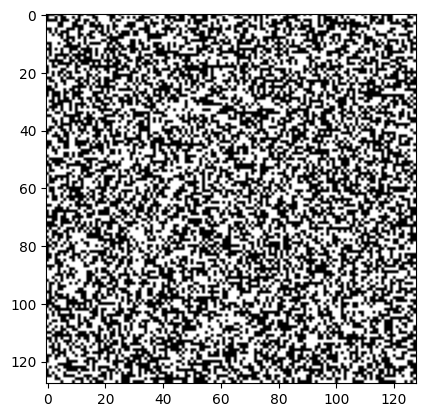

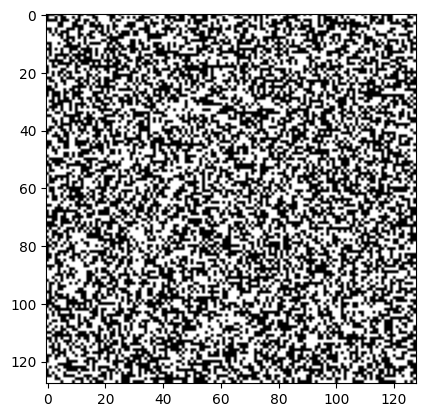

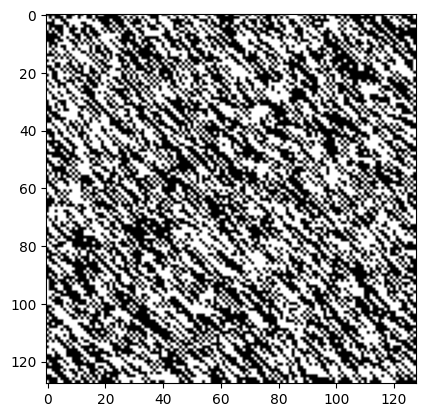

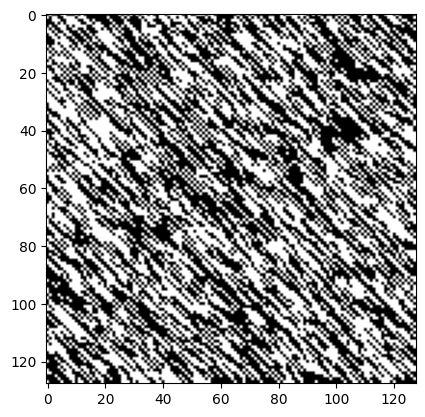

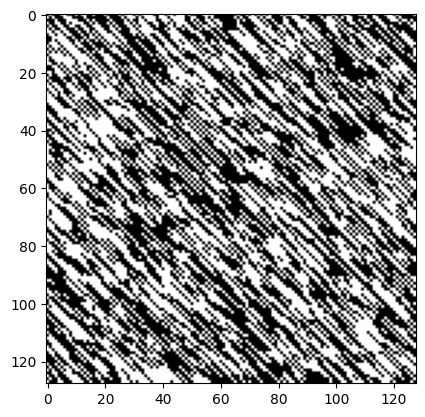

...

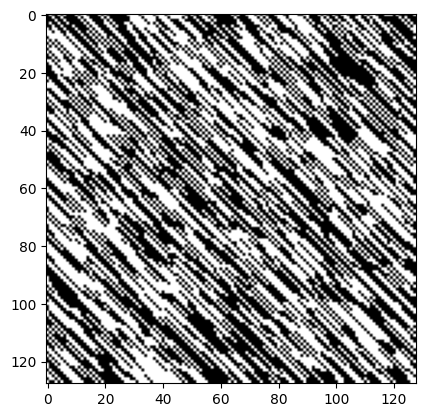

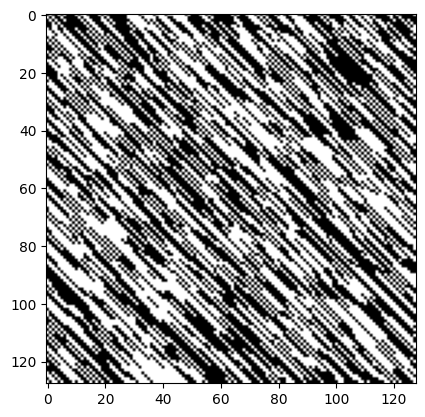

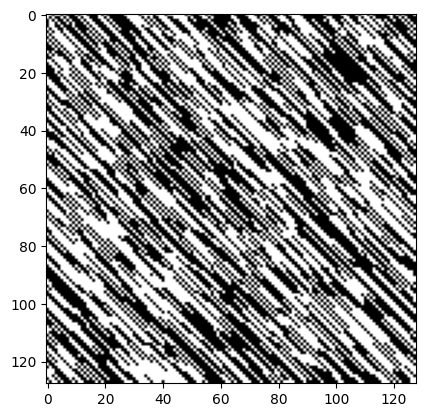

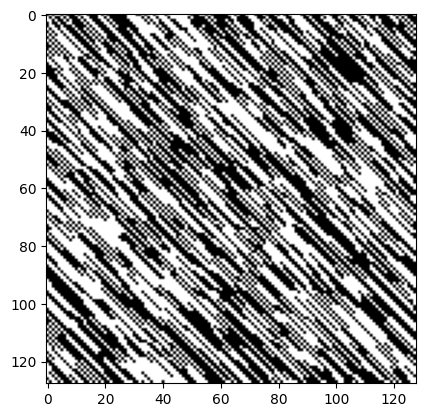

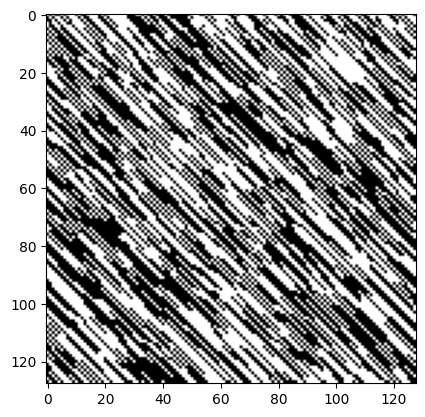

In [ ]:
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=20
mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

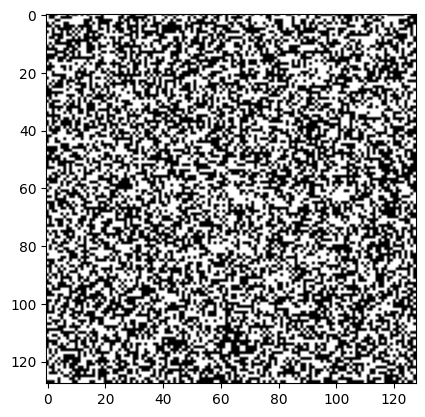

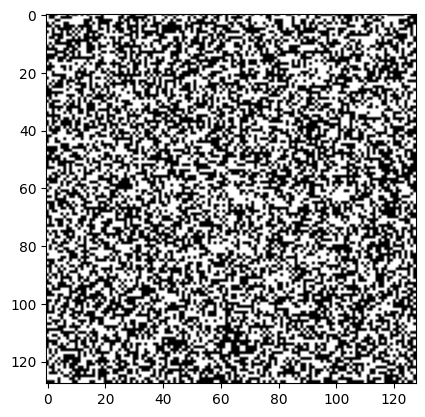

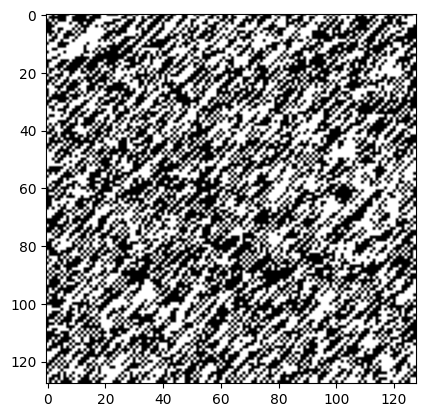

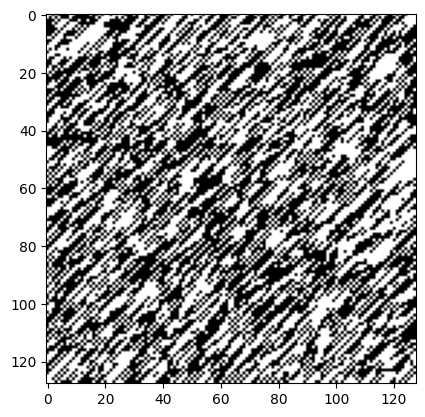

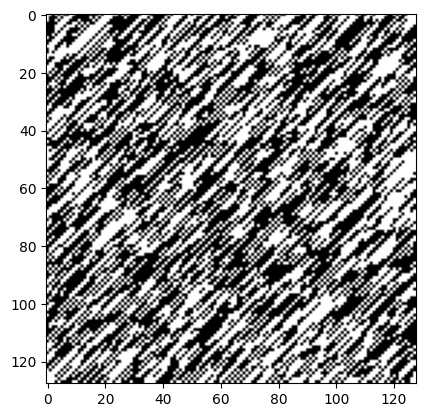

...

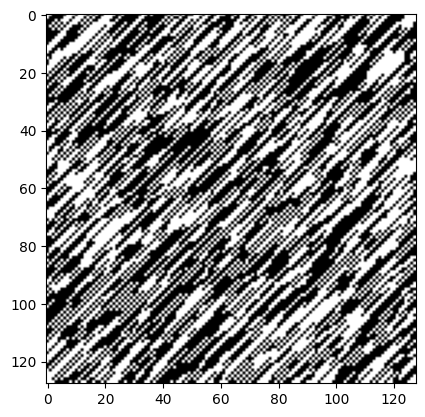

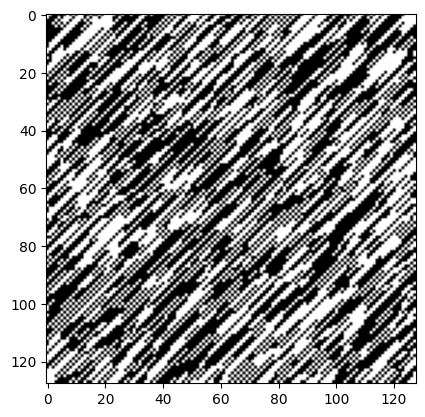

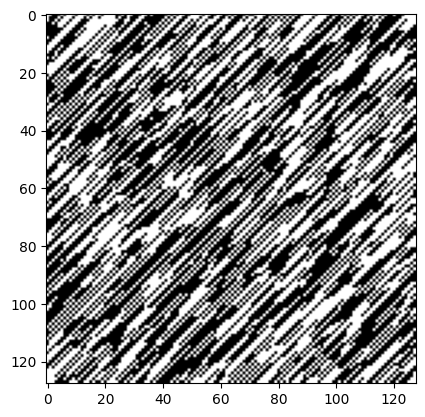

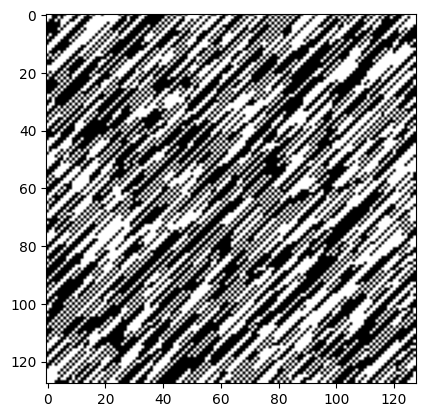

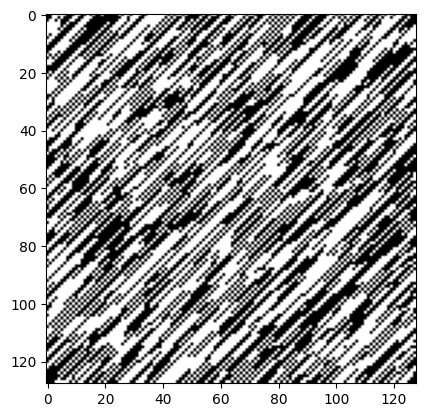

In [ ]:
def echan(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0=((1 if im_bin[i1, j2] == 1 else 0) + (1 if im_bin[i2, j1] == 1 else 0))*beta_reg
            p0=math.exp(Ureg0*(-1));

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1=((1 if im_bin[i1, j2] == 0 else 0) + (1 if im_bin[i2, j1] == 0 else 0))*beta_reg
            p1=math.exp(Ureg1*(-1));

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j] = 0
                else :
                    im_bin[i,j]= 1

    return im_bin

plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=20
mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

The pixels are encouraged to assume the direction of their potentials. So, the isotropy can be visuzalized in the diagonal that appears in the image, in the $\pi/4$ direction

#Checking the question 7

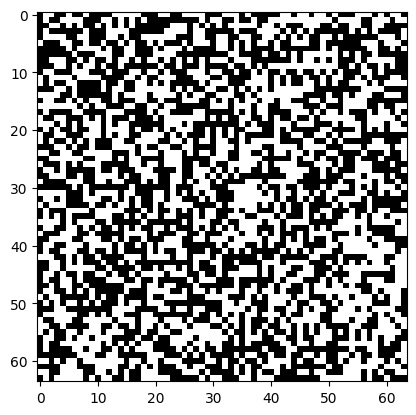

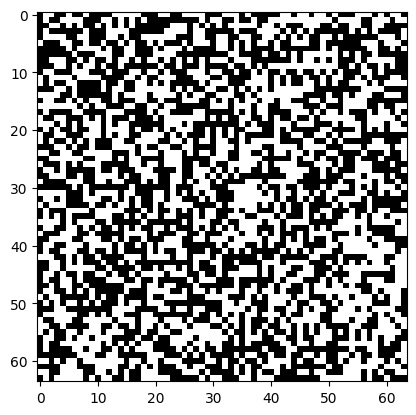

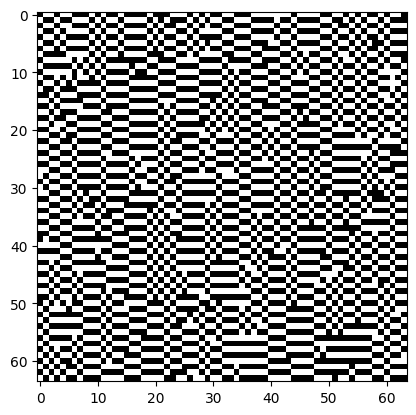

In [ ]:
def echan(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0=((-1 if im_bin[i1, j] == 1 else 0))*beta_reg
            p0=math.exp(Ureg0*(-1));

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1=((-1 if im_bin[i1, j] == 0 else 0))*beta_reg
            p1=math.exp(Ureg1*(-1));

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j] = 0
                else :
                    im_bin[i,j]= 1

    return im_bin

plt.set_cmap('gray')
sh=[64,64]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=3
mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    if(n == 10):
      plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
      mafigure.canvas.draw()
      plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

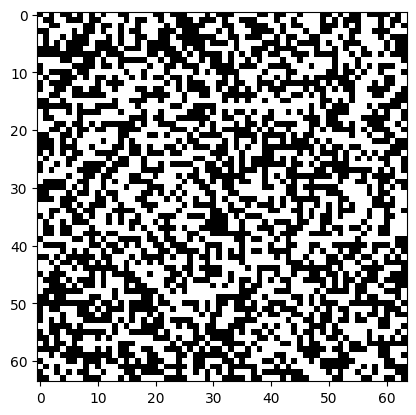

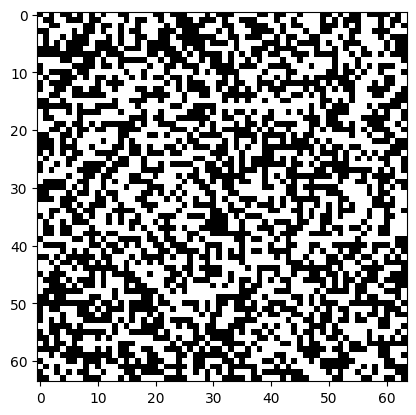

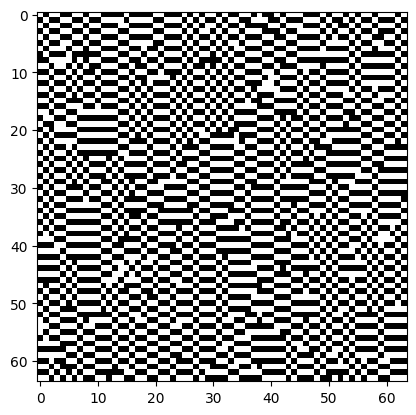

In [ ]:
def echan(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0=((-1 if im_bin[i1, j] == 1 else 0) + (1 if im_bin[i1, j] == 1 else 0))*beta_reg
            p0=math.exp(Ureg0*(-1));

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1=((-1 if im_bin[i1, j] == 0 else 0) + + (1 if im_bin[i1, j] == 1 else 0))*beta_reg
            p1=math.exp(Ureg1*(-1));

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j] = 0
                else :
                    im_bin[i,j]= 1

    return im_bin

plt.set_cmap('gray')
sh=[64,64]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=3
mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(50):
    echan(im_bin,beta_reg)
    if(n == 50):
      plt.imshow(im_bin, cmap = 'binary', vmin = 0, vmax=1)
      mafigure.canvas.draw()
      plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()